In [1]:
import velvet as vt

# general packages
import numpy as np
import pandas as pd
import torch
from scipy.sparse import issparse

# velocity packages
import scanpy as sc
import scvelo as scv
import anndata as ann

# plotting packages
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm, trange
from IPython.display import clear_output

# color palette object
from colors import colorpalette as colpal

Global seed set to 0
/camp/home/maizelr/.local/lib/python3.10/site-packages/pytorch_lightning/utilities/warnings.py:53: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
  new_rank_zero_deprecation(
/camp/home/maizelr/.local/lib/python3.10/site-packages/pytorch_lightning/utilities/warnings.py:58: LightningDeprecationWarning: The `pytorch_lightning.loggers.base.rank_zero_experiment` is deprecated in v1.7 and will be removed in v1.9. Please use `pytorch_lightning.loggers.logger.rank_zero_experiment` instead.
  return new_rank_zero_deprecation(*args, **kwargs)


In [2]:
from anndata._core.anndata import AnnData
from matplotlib import patches

In [3]:
nmp = sc.read_h5ad('../data/nmp_data_1606.h5ad')

state_path = '../models/nmp_vf_1606_model.pt'

vt.md.Velvet.setup_anndata(nmp, x_layer='total', n_layer='new', knn_layer='knn_index')

model = vt.md.Velvet(
    nmp,
    n_latent = 50,
    linear_decoder = True,
    neighborhood_space="latent_space",
    biophysical_model = "full",
    gamma_mode = "learned",
    labelling_time = 2.0,
)

model.setup_model()

trained_state = torch.load(state_path)['model_state_dict']

model.module.load_state_dict(trained_state)

INFO     Generating sequential column names                                                                        


<All keys matched successfully>

In [4]:
model.module = model.module.to('cuda')

model.adata.obs['index'] = np.arange(model.adata.shape[0])

vt.sm.VelvetSDE.setup_anndata(
    model, 
    x_layer='total', 
    index_key='index'
)

markov = vt.sb.MarkovProcess(
    model,
    n_neighbors=10,
    use_space='latent_space',
    use_spline=True, 
    use_similarity=False
)

sde = vt.sb.SDE(
    model.module.n_latent,
    prior_vectorfield=model.module.vf,
    noise_scalar=0.1,
    device=model.device
)

sde_model = vt.sm.VelvetSDE(
    model,
    sde,
    markov,
)


sde_state_path = '../models/nmp_sde_1606_model.pt'

trained_state_sde = torch.load(sde_state_path)['model_state_dict']

sde_model.module.load_state_dict(trained_state_sde)

KNN indices for Velvet stored in .obsm['knn_index'].


<All keys matched successfully>

In [5]:
initial_cells = sde_model.adata[sde_model.adata.obs.timepoint=='D3.2'][:400]

trajectories, cell_ids = sde_model.simulate(
    initial_cells=initial_cells,
    n_samples_per_cell=1,
    n_steps = 100,
    t_max = 60,
    dt = 1.0,
    latent_key='X_z',
    n_chunks=10
)

avg_center, labels, centers, index = vt.cl.cluster_trajectories(trajectories, n_clusters=2)
cluster_labels = labels.cpu().numpy()

Simulating Chunk 9: 100%|██████████| 10/10 [00:05<00:00,  1.70it/s]


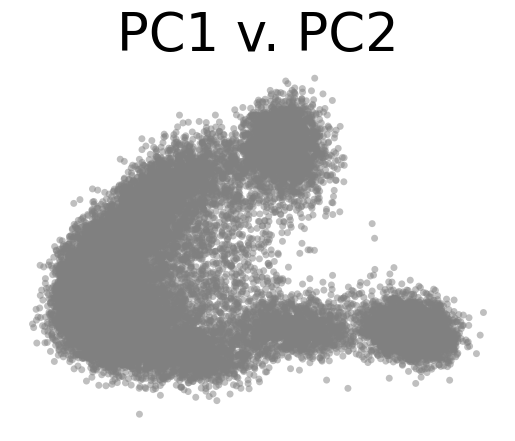

In [11]:
components=[0,1]

cmap = {0:'gold',1:'limegreen'}
clmap = {0:'Neural Trajectories',1:'Mesoderm Trajectories'}

z = model.adata.obsm['X_z']
z = torch.tensor(z, device=model.device)

pca = PCA()
z_pca = pca.fit_transform(z.detach().cpu().numpy())

t_pca = []
for traj in trajectories:
    t_pca.append(pca.transform(traj.detach().cpu().numpy()))

copy = model.adata.copy()
copy.obsm['X_vae'] = z_pca
copy.uns["velocity_params"] = {'embeddings':'vae'}

scv.pl.scatter(copy, basis='vae', color='grey', alpha=0.5, palette=colpal.timepoint,
               size=100, show=True, components=f"{components[0]+1},{components[1]+1}",
               legend_loc=False, title="PC1 v. PC2", fontsize=38)

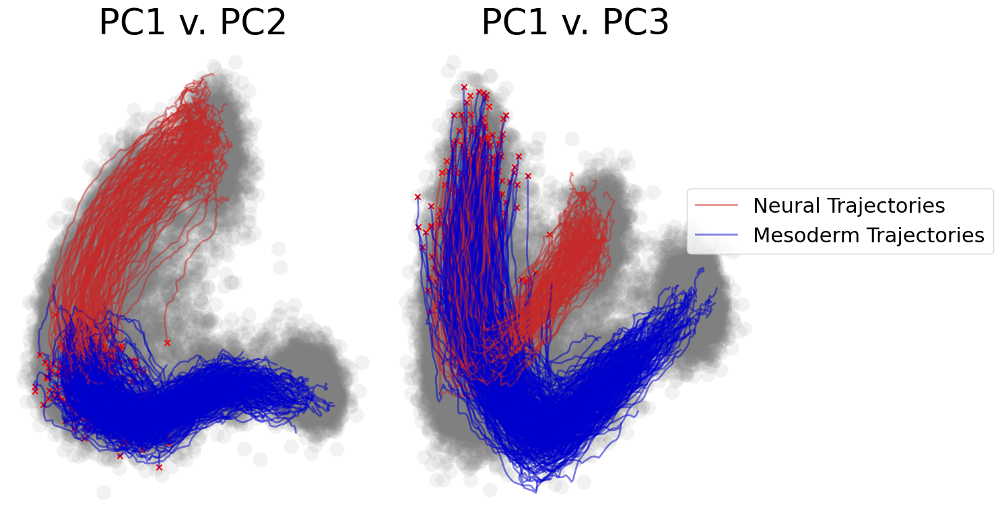

In [17]:
components=[0,1]

cmap = {0:'#C62A29',1:'mediumblue'}
clmap = {0:'Neural Trajectories',1:'Mesoderm Trajectories'}

z = model.adata.obsm['X_z']
z = torch.tensor(z, device=model.device)

pca = PCA()
z_pca = pca.fit_transform(z.detach().cpu().numpy())

t_pca = []
for traj in trajectories:
    t_pca.append(pca.transform(traj.detach().cpu().numpy()))

copy = model.adata.copy()
copy.obsm['X_vae'] = z_pca
copy.uns["velocity_params"] = {'embeddings':'vae'}
fig = plt.figure(figsize=(15,8))
ax1, ax2 = fig.subplots(1,2)

scv.pl.scatter(copy, basis='vae', color='grey', alpha=0.1, palette=colpal.timepoint,
              ax=ax1, size=1000, show=False, components=f"{components[0]+1},{components[1]+1}",
               legend_loc=False, title="PC1 v. PC2", fontsize=38)
scv.pl.scatter(copy, basis='vae', color='grey', alpha=0.1, palette=colpal.timepoint,
              ax=ax2, size=1000, show=False, components=f"{components[0]+1},{components[1]+2}",
               legend_loc='right margin', title="PC1 v. PC3", fontsize=38)
groups = []
for t, cl in zip(t_pca, cluster_labels):
    color = cmap[cl]
    if cl in groups:
        label=''
    else:
        label=clmap[cl]
        groups.append(cl)
    ax1.scatter(t[0,components[0]],t[0,components[1]], color='red', marker='x')
    ax2.scatter(t[0,components[0]],t[0,components[1]+1], color='red', marker='x')
    ax1.plot(t[:,components[0]],t[:,components[1]], color=color, alpha=.5, linewidth=2, label=label)
    ax2.plot(t[:,components[0]],t[:,components[1]+1], color=color, alpha=.5, linewidth=2, label=label)

plt.suptitle("", fontsize=30, y=1.02)
plt.legend(loc=(.8,.55),fontsize=22)
plt.tight_layout()
plt.savefig('../figures/2.6.0_nmp_decision_boundary.png', dpi=300)
plt.show()

## Decision boundary

In [7]:
initial_cells = sde_model.adata[sde_model.adata.obs.timepoint=='D3.2']

trajectories, cell_ids = sde_model.simulate(
    initial_cells=initial_cells,
    n_samples_per_cell=10,
    n_steps = 100,
    t_max = 70,
    dt = 1.0,
    latent_key='X_z',
    n_chunks=10
)

Simulating Chunk 9: 100%|██████████| 10/10 [00:00<00:00, 15.40it/s]


In [8]:
%%time
avg_center, labels, centers, index = vt.cl.cluster_trajectories(trajectories, n_clusters=2)
cluster_labels = labels.cpu().numpy()

CPU times: user 2min 24s, sys: 4.83 s, total: 2min 29s
Wall time: 2min 29s


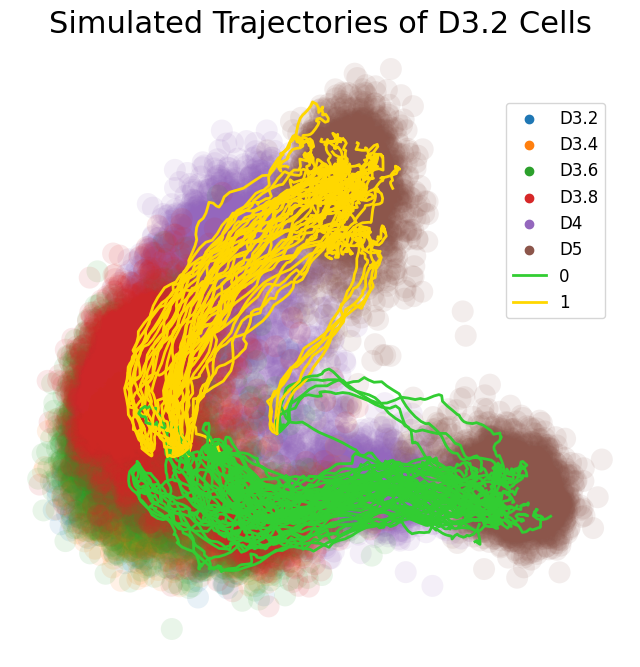

In [9]:
components=[0,1]

cmap = {1:'gold',0:'limegreen',2:'red',3:'blue'}
clmap = {1:'1',0:'0',2:'2',3:'3'}

z = model.adata.obsm['X_z']
z = torch.tensor(z, device=model.device)

pca = PCA()
z_pca = pca.fit_transform(z.detach().cpu().numpy())

t_pca = []
for traj in trajectories[:100]:
    t_pca.append(pca.transform(traj.detach().cpu().numpy()))

copy = model.adata.copy()
copy.obsm['X_vae'] = z_pca
copy.uns["velocity_params"] = {'embeddings':'vae'}
fig, ax = plt.subplots(figsize=(8,8))

scv.pl.scatter(copy, basis='vae', color='timepoint', alpha=0.1,
              ax=ax, size=1000, show=False, components=f"{components[0]+1},{components[1]+1}",
               legend_loc='right margin')

groups = []
for t, cl in zip(t_pca, cluster_labels[:100]):
    color = cmap[cl]
    if cl in groups:
        label=''
    else:
        label=clmap[cl]
        groups.append(cl)
    ax.plot(t[:,components[0]],t[:,components[1]], color=color, alpha=1, linewidth=2, label=label)
ax.set_title("Simulated Trajectories of D3.2 Cells", fontsize=22)
plt.legend(loc=(.8,.55),fontsize=12)
plt.show()

In [10]:
clmap = {1:'Neural',0:'Mesoderm'}

In [11]:
def bifurcation_probability(
    initial_cells,
    cell_ids,
    cluster_labels
):
    n_cells = initial_cells.shape[0]
    all_cell_ids = np.arange(n_cells)
    
    cell_ids = np.array(cell_ids)
    cluster_labels = np.array(cluster_labels)
    
    fates = np.unique(cluster_labels)
    cells = np.unique(cell_ids)
    data_dict = {fate:np.zeros(n_cells) for fate in fates}
    
    for i in range(n_cells):
        if i in cells:
            cell_fates = cluster_labels[cell_ids==i]
            for fate in fates:
                data_dict[fate][i] = np.mean(cell_fates==fate)
        else:
            for fate in fates:
                data_dict[fate][i] = 0
            
    
    for fate in fates:
        initial_cells.obs[f"fate_prob_{fate}"] = data_dict[fate]
        
    return initial_cells

bifurcation_probability(
    initial_cells,
    cell_ids,
    cluster_labels
)

AnnData object with n_obs × n_vars = 2824 × 1229
    obs: 'X_TC_alpha', 'total_TC_alpha', 'unspliced_TC_alpha', 'spliced_TC_alpha', 'p_e', 'p_c_TC', 'sample', 'timepoint', 'rep', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'label_rate', 'doublet_score', 'marker_based_classification', 'cell_annotation', '_scvi_batch', '_scvi_labels', 'index', 'fate_prob_0', 'fate_prob_1'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'neighbors'
    obsm: 'Ts', 'X_z', 'knn_index', 'velocity_z'
    layers: 'new', 'old', 'total'
    obsp: 'connectivities', 'distances'

In [12]:
sde_model.module.sde.noise_scalar

0.1

In [13]:
model.adata.layers['velocity'] = model.predict_velocity()
    
initial_cells.layers['velocity'] = model.adata[initial_cells.obs_names].layers['velocity'].copy()

In [14]:
initial_cells.obs['mixed_fate'] = ((initial_cells.obs.fate_prob_0.values>0)&
                                   (initial_cells.obs.fate_prob_1.values>0))
fatedesc = []
for f0, f1 in zip(initial_cells.obs.fate_prob_0.values,initial_cells.obs.fate_prob_1.values):
    if f1==1:
        f = clmap[f1]
    elif f0==1:
        f = clmap[f1]
    elif f0==0 and f1==0:
        f = 'off-manifold'
    else:
        f = 'Mixed'
    fatedesc.append(f)
    
initial_cells.obs['fate_description'] = fatedesc

initial_cells.obsm['X_zpca'] = PCA().fit_transform(initial_cells.obsm['X_z'])

plot_cells = initial_cells[initial_cells.obs.fate_description!='off-manifold'].copy()

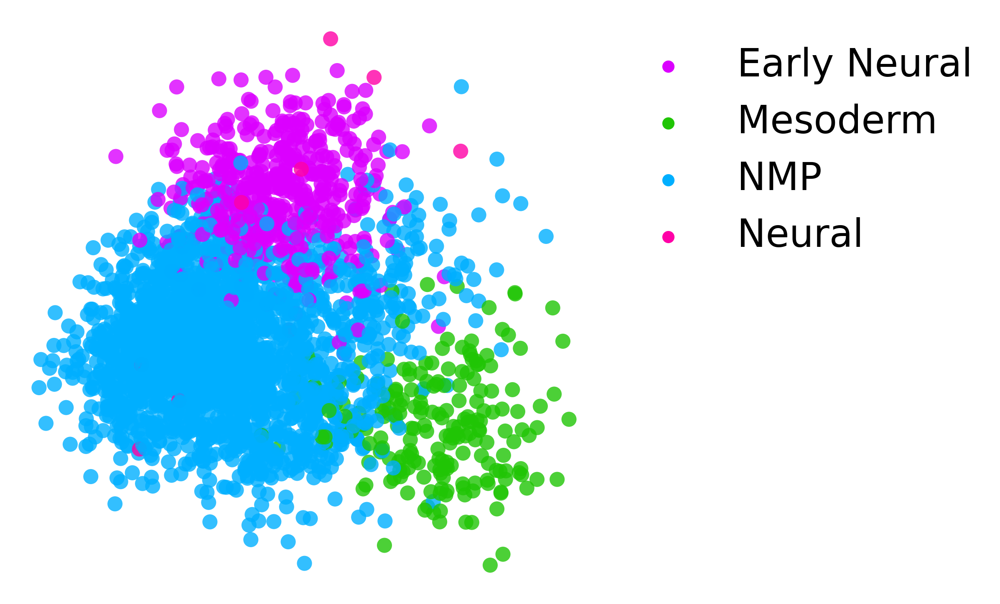

In [15]:
fig, ax = plt.subplots(figsize=(6,6), dpi=300)
scv.pl.scatter(plot_cells, alpha=0.8, ax=ax, size=300, legend_fontsize=22, 
               title='', fontsize=22, palette=colpal.celltype,
                basis='zpca', color='cell_annotation', components="1,2", show=False)

for fig in plt.get_fignums():
    fig = plt.figure(fig)
    # Set the figure facecolor to transparent
    fig.patch.set_facecolor('none')

    # Loop over the axes in the figure
    for ax in fig.get_axes():
        # Set the axes facecolor to white
        ax.set_facecolor('white')

plt.savefig('../figures/2.6.2_D3.2_cell_annotations.png', bbox_inches='tight')
plt.show()

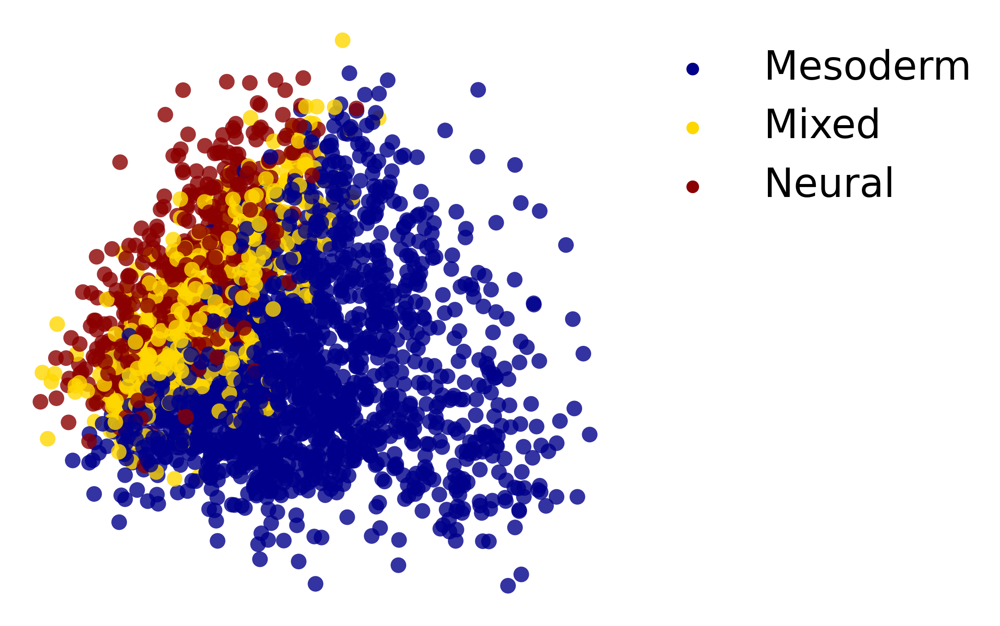

In [16]:
pal = {'Mesoderm':'darkblue','Neural':'darkred','Mixed':'gold','off-manifold':'lightgrey'}

fig, ax = plt.subplots(figsize=(6,6), dpi=300)
scv.pl.scatter(plot_cells, alpha=0.8, ax=ax, size=300, legend_fontsize=22,
               title='', fontsize=22, palette=pal,
               basis='zpca', color='fate_description', components="1,2", show=False)

for fig in plt.get_fignums():
    fig = plt.figure(fig)
    # Set the figure facecolor to transparent
    fig.patch.set_facecolor('none')

    # Loop over the axes in the figure
    for ax in fig.get_axes():
        # Set the axes facecolor to white
        ax.set_facecolor('white')

plt.savefig('../figures/2.6.1_D3.2_decision_boundary.png', bbox_inches='tight')

plt.show()

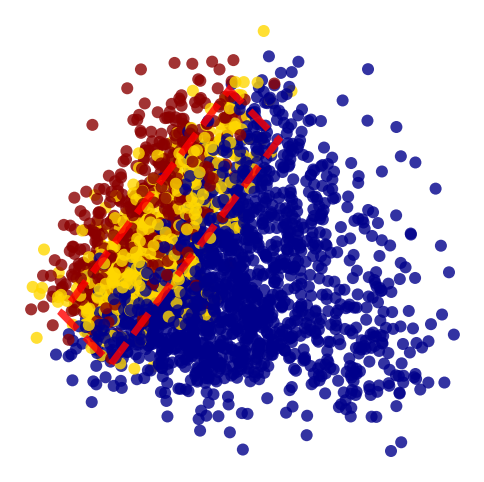

In [17]:
pal = {'Mesoderm':'darkblue','Neural':'darkred','Mixed':'gold','off-manifold':'lightgrey'}

fig, ax = plt.subplots(figsize=(6,6), dpi=100)
scv.pl.scatter(plot_cells, alpha=0.8, ax=ax, size=300, legend_loc=False, 
               title='', fontsize=22, palette=pal,
               basis='zpca', color='fate_description', components="1,2", show=False)

box_centre = (-2.4,-2.4)
bw, bh = 7, 1.8
bangle=49

rect = patches.Rectangle(box_centre, bw, bh, linewidth=5, edgecolor='red', linestyle='--', alpha=0.8,
                         facecolor='none', angle=bangle)

ax.add_patch(rect)


plt.show()

In [18]:
plot_cells2 = plot_cells.copy()
plot_cells2.X = plot_cells.layers['total'].copy()
plot_cells2.X = np.log1p(plot_cells2.X)

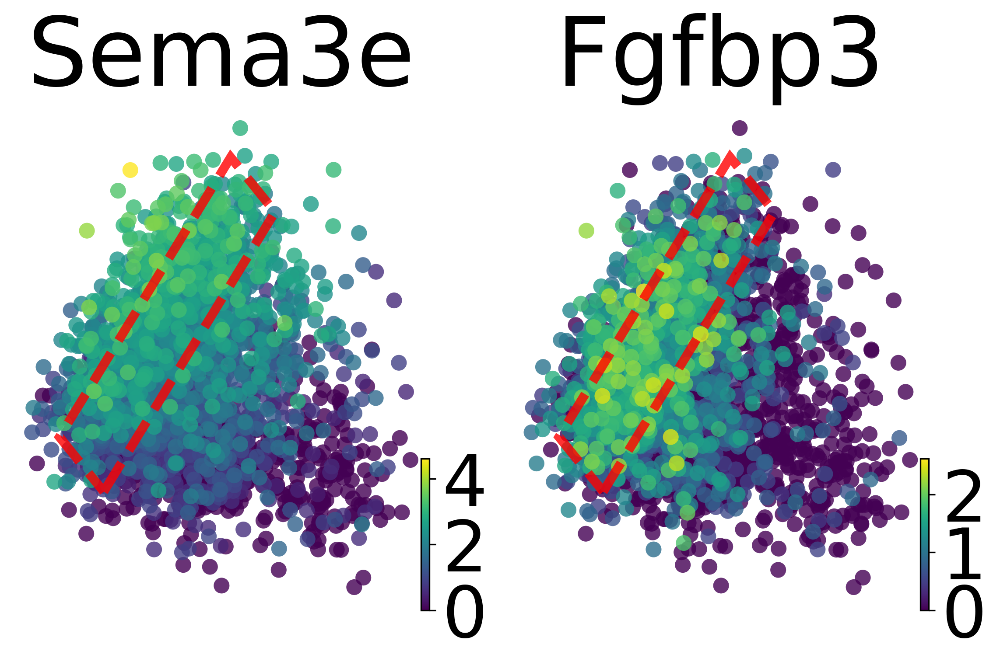

In [24]:
box_centre = (-2.4,-2.4)
bw, bh = 8, 1.8
bangle=49

fig = plt.figure(figsize=(9,5), dpi=300)
ax1,ax2 = fig.subplots(1,2)

scv.pl.scatter(plot_cells2, alpha=0.8, size=300, legend_fontsize=32, fontsize=52, palette=pal,
               basis='zpca', color=['Sema3e'], components="1,2", ax=ax1, show=False)
scv.pl.scatter(plot_cells2, alpha=0.8, size=300, legend_fontsize=32, fontsize=52, palette=pal,
               basis='zpca', color=['Fgfbp3'], components="1,2", ax=ax2, show=False)


rect = patches.Rectangle(box_centre, bw, bh, linewidth=5, edgecolor='red', linestyle='--', alpha=0.8,
                         facecolor='none', angle=bangle)
ax1.add_patch(rect)
rect = patches.Rectangle(box_centre, bw, bh, linewidth=5, edgecolor='red', linestyle='--', alpha=0.8,
                         facecolor='none', angle=bangle)
ax2.add_patch(rect)

for fig in plt.get_fignums():
    fig = plt.figure(fig)
    # Set the figure facecolor to transparent
    fig.patch.set_facecolor('none')

    # Loop over the axes in the figure
    for ax in fig.get_axes():
        # Set the axes facecolor to white
        ax.set_facecolor('white')

plt.savefig('../figures/2.6.3_D3.2_neural_genes.png', bbox_inches='tight')
plt.show()

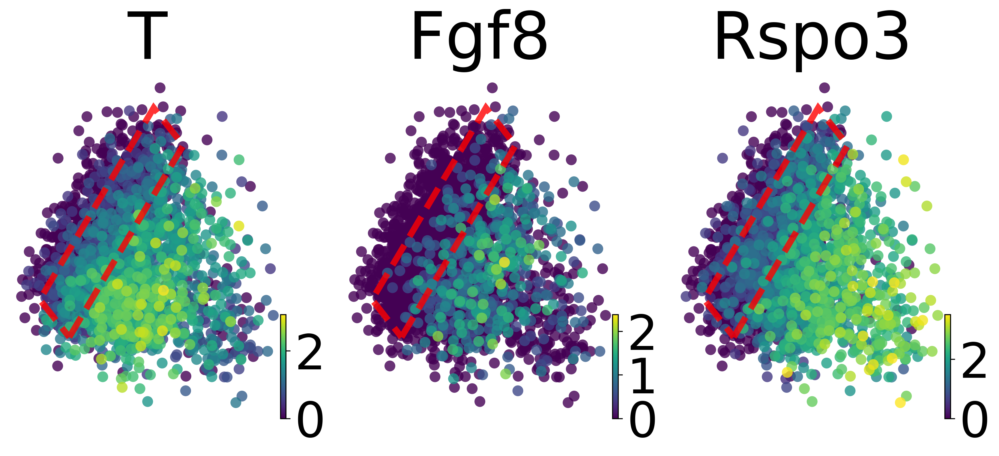

In [26]:
fig = plt.figure(figsize=(13.5,5), dpi=300)
ax1,ax2,ax3 = fig.subplots(1,3)

scv.pl.scatter(plot_cells2, alpha=0.8, size=300, legend_fontsize=32, fontsize=52, palette=pal,
               basis='zpca', color=['T'], components="1,2", ax=ax1, show=False)
scv.pl.scatter(plot_cells2, alpha=0.8, size=300, legend_fontsize=32, fontsize=52, palette=pal,
               basis='zpca', color=['Fgf8'], components="1,2", ax=ax2, show=False)
scv.pl.scatter(plot_cells2, alpha=0.8, size=300, legend_fontsize=32, fontsize=52, palette=pal,
               basis='zpca', color=['Rspo3'], components="1,2", ax=ax3, show=False)

rect = patches.Rectangle(box_centre, bw, bh, linewidth=5, edgecolor='red', linestyle='--', alpha=0.8,
                         facecolor='none', angle=bangle)
ax1.add_patch(rect)
rect = patches.Rectangle(box_centre, bw, bh, linewidth=5, edgecolor='red', linestyle='--', alpha=0.8,
                         facecolor='none', angle=bangle)
ax2.add_patch(rect)
rect = patches.Rectangle(box_centre, bw, bh, linewidth=5, edgecolor='red', linestyle='--', alpha=0.8,
                         facecolor='none', angle=bangle)
ax3.add_patch(rect)

for fig in plt.get_fignums():
    fig = plt.figure(fig)
    # Set the figure facecolor to transparent
    fig.patch.set_facecolor('none')

    # Loop over the axes in the figure
    for ax in fig.get_axes():
        # Set the axes facecolor to white
        ax.set_facecolor('white')

plt.savefig('../figures/2.6.4_D3.2_meso_genes.png', bbox_inches='tight')
plt.show()

In [27]:
def plot_velocity(adata, gene, **kwargs):
    model.adata.layers['velocity'] = model.predict_velocity()

    adata.layers['velocity'] = model.adata[adata.obs_names].layers['velocity']
    adata.obs['plot_velocity'] = np.array(adata[:,gene].layers['velocity']).flatten()
    scv.pl.scatter(adata,  color='plot_velocity', **kwargs)

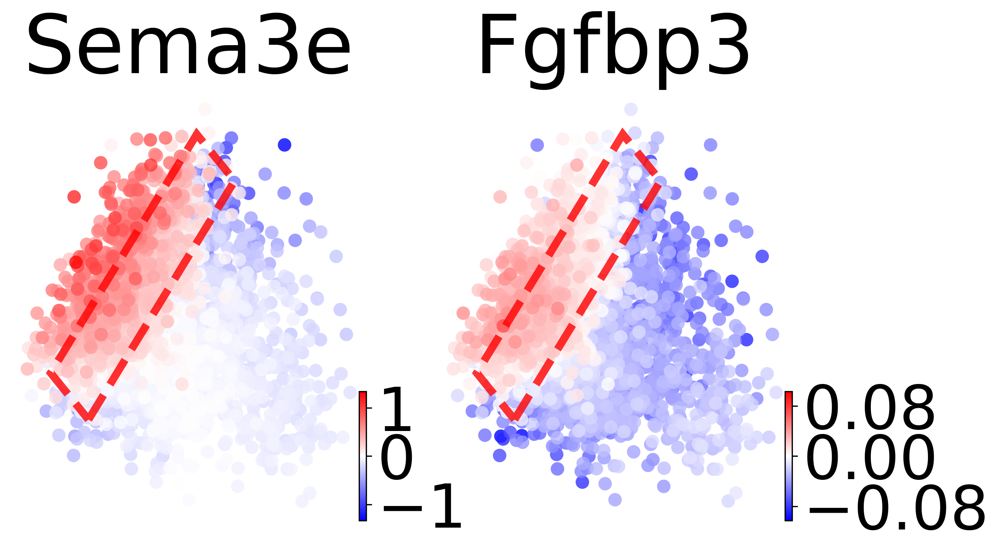

In [30]:
box_centre = (-2.4,-2.4)
bw, bh = 8, 1.8
bangle=49

fig = plt.figure(figsize=(9,5), dpi=300)
ax1,ax2 = fig.subplots(1,2)

ic = plot_cells.copy()
ic.obsm['X_VIZ'] = PCA().fit_transform(ic.obsm['X_z'])

ic.X = np.log1p(ic.X)

plot_velocity(ic, gene='Sema3e', alpha=0.8, size=300, title='Sema3e', 
              legend_fontsize=22, fontsize=52, palette=pal,
               basis='VIZ', components="1,2", ax=ax1, show=False, color_map='bwr')
plot_velocity(ic, gene='Fgfbp3', alpha=0.8, size=300, title='Fgfbp3', 
              legend_fontsize=22, fontsize=52, palette=pal,
               basis='VIZ', components="1,2", ax=ax2, show=False, color_map='bwr')


rect = patches.Rectangle(box_centre, bw, bh, linewidth=5, edgecolor='red', linestyle='--', alpha=0.8,
                         facecolor='none', angle=bangle)
ax1.add_patch(rect)
rect = patches.Rectangle(box_centre, bw, bh, linewidth=5, edgecolor='red', linestyle='--', alpha=0.8,
                         facecolor='none', angle=bangle)
ax2.add_patch(rect)
rect = patches.Rectangle(box_centre, bw, bh, linewidth=5, edgecolor='red', linestyle='--', alpha=0.8,
                         facecolor='none', angle=bangle)


for fig in plt.get_fignums():
    fig = plt.figure(fig)
    # Set the figure facecolor to transparent
    fig.patch.set_facecolor('none')

    # Loop over the axes in the figure
    for ax in fig.get_axes():
        # Set the axes facecolor to white
        ax.set_facecolor('white')

plt.savefig('../figures/2.6.4_D3.2_neural_velos.png', bbox_inches='tight')
plt.show()

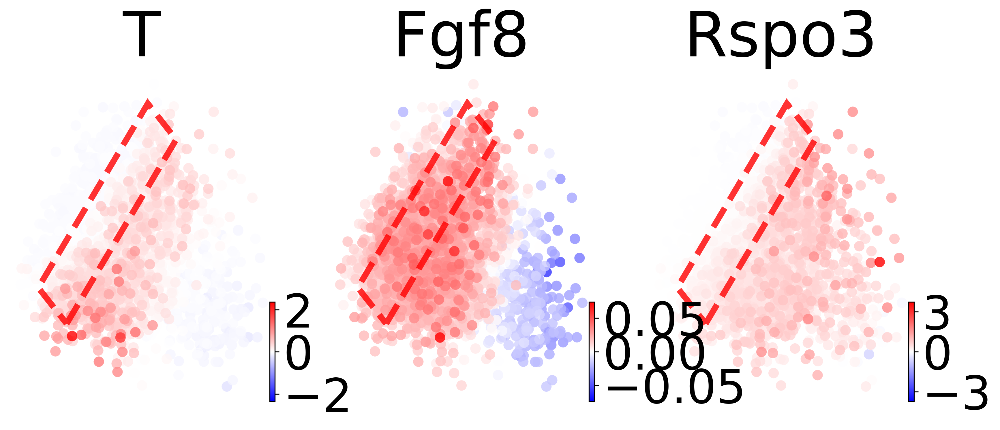

In [31]:
fig = plt.figure(figsize=(13.5,5), dpi=300)
ax1,ax2,ax3 = fig.subplots(1,3)

ic = plot_cells.copy()
ic.obsm['X_VIZ'] = PCA().fit_transform(ic.obsm['X_z'])

ic.X = np.log1p(ic.X)

plot_velocity(ic, gene='T', alpha=0.8, size=300, title='T', 
              legend_fontsize=22, fontsize=52, palette=pal,
               basis='VIZ', components="1,2", ax=ax1, show=False, color_map='bwr')
plot_velocity(ic, gene='Fgf8', alpha=0.8, size=300, title='Fgf8', 
              legend_fontsize=22, fontsize=52, palette=pal,
               basis='VIZ', components="1,2", ax=ax2, show=False, color_map='bwr')
plot_velocity(ic, gene='Rspo3', alpha=0.8, size=300, title='Rspo3', 
              legend_fontsize=22, fontsize=52, palette=pal,
               basis='VIZ', components="1,2", ax=ax3, show=False, color_map='bwr')

rect = patches.Rectangle(box_centre, bw, bh, linewidth=5, edgecolor='red', linestyle='--', alpha=0.8,
                         facecolor='none', angle=bangle)
ax1.add_patch(rect)
rect = patches.Rectangle(box_centre, bw, bh, linewidth=5, edgecolor='red', linestyle='--', alpha=0.8,
                         facecolor='none', angle=bangle)
ax2.add_patch(rect)
rect = patches.Rectangle(box_centre, bw, bh, linewidth=5, edgecolor='red', linestyle='--', alpha=0.8,
                         facecolor='none', angle=bangle)
ax3.add_patch(rect)

for fig in plt.get_fignums():
    fig = plt.figure(fig)
    # Set the figure facecolor to transparent
    fig.patch.set_facecolor('none')

    # Loop over the axes in the figure
    for ax in fig.get_axes():
        # Set the axes facecolor to white
        ax.set_facecolor('white')

plt.savefig('../figures/2.6.5_D3.2_meso_velos.png', bbox_inches='tight')
plt.show()

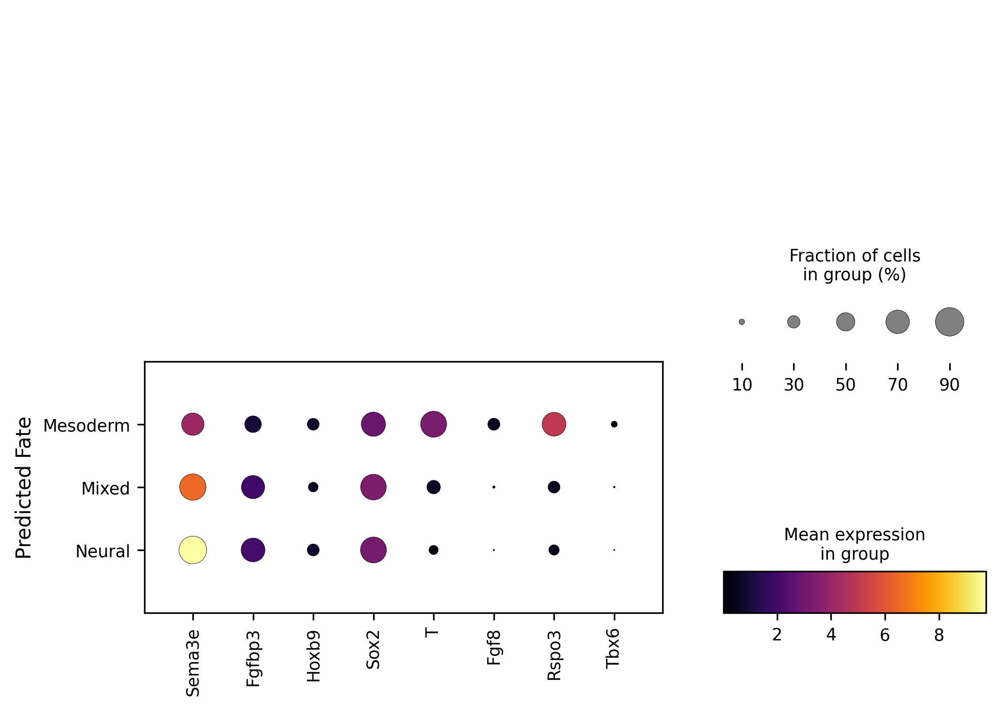

In [57]:
all_genes = ['Sema3e','Fgfbp3','Hoxb9','Sox2','T','Fgf8','Rspo3','Tbx6']
fig, ax = plt.subplots(dpi=300, figsize=(7,5))
axes = sc.pl.dotplot(plot_cells, groupby='fate_description', cmap='inferno',
                     var_names=all_genes, ax=ax, show=False)
axes['mainplot_ax'].set_ylabel("Predicted Fate")
plt.tight_layout()

for fig in plt.get_fignums():
    fig = plt.figure(fig)
    # Set the figure facecolor to transparent
    fig.patch.set_facecolor('none')

    # Loop over the axes in the figure
    for ax in fig.get_axes():
        # Set the axes facecolor to white
        ax.set_facecolor('white')

plt.savefig('../figures/2.6.6_D3.2_fate_dotplot.png', bbox_inches='tight')
plt.show()

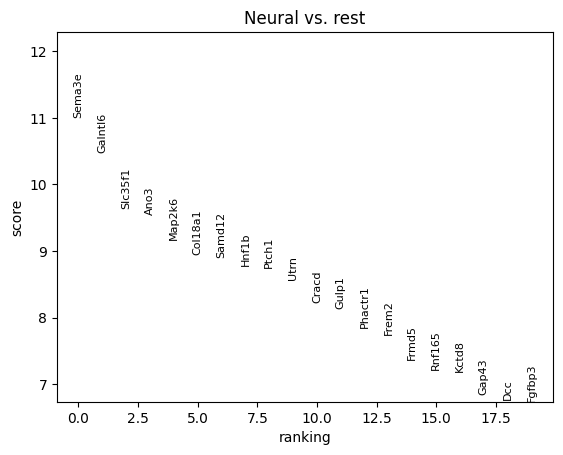

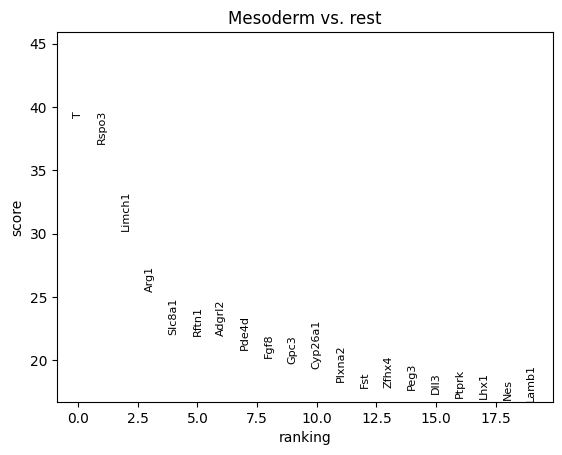

In [112]:
sc.tl.rank_genes_groups(plot_cells2, groupby='fate_description', groups=['Neural'], reference='rest')
sc.pl.rank_genes_groups(plot_cells2, groups=['Neural'], n_genes=20)
neu = [a[0] for a in plot_cells2.uns['rank_genes_groups']['names']]

sc.tl.rank_genes_groups(plot_cells2, groupby='fate_description', groups=['Mesoderm'], reference='rest')
sc.pl.rank_genes_groups(plot_cells2, groups=['Mesoderm'], n_genes=20)
mes = [a[0] for a in plot_cells2.uns['rank_genes_groups']['names']]

gns = neu[:50]+mes[:50]

In [124]:
sortidx =np.argsort([float(plot_cells2[plot_cells2.obs.fate_description=='Mesoderm'][:,g].X.mean()) for g in gns])

In [ ]:
ax = sc.pl.heatmap(
    plot_cells2, 
    np.array(gns)[sortidx],
    groupby='fate_description', 
    cmap='plasma', 
    swap_axes=False, 
    dendrogram=False,
    show=False,figsize=(20,3), show_gene_labels=True,
)
fig = plt.gcf()

# Adjust the DPI
fig.set_dpi(300)


In [135]:
plot_cells.write_h5ad("../data/adata_nmp_decision_boundary_cells.h5ad")

AnnData object with n_obs × n_vars = 2824 × 1229
    obs: 'X_TC_alpha', 'total_TC_alpha', 'unspliced_TC_alpha', 'spliced_TC_alpha', 'p_e', 'p_c_TC', 'sample', 'timepoint', 'rep', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'label_rate', 'doublet_score', 'marker_based_classification', 'cell_annotation', '_scvi_batch', '_scvi_labels', 'index', 'fate_prob_0', 'fate_prob_1', 'mixed_fate', 'fate_description'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'neighbors', 'cell_annotation_colors', 'fate_description_colors', 'dendrogram_fate_description', 'rank_genes_groups'
    obsm: 'Ts', 'X_z', 'knn_index', 'velocity_z', 'X_zpca', 'X_pca'
    layers: 'new', 'old', 'total', 'velocity'
    obsp: 'connectivities', 'distances'

# (D3 for supplementary)

In [254]:
adata0 = vt.pp.read("../data/celltyped_adata.h5ad")
adata0 = adata0[adata0.obs.cell_annotation!='other']

nmp_d3 = adata0[[tp in ['D3'] for tp in adata0.obs.timepoint]]

nmp_genes = vt.pp.select_genes(
    nmp, 
    n_variable_genes=2000, 
    stratify_obs='rep')

nmp_d3 = vt.pp.size_normalize(
    nmp_d3, 
    genes=nmp_genes, 
    total_layer='total', 
    new_layer='new',
    unsparsify=True
)

vt.pp.neighborhood(nmp_d3)

nmp_d3 = nmp_d3.copy()

vt.ut.set_seed(0)

vt.md.Velvet.setup_anndata(nmp_d3, x_layer='total', n_layer='new', knn_layer='knn_index')

model_d3 = vt.md.Velvet(
    nmp_d3,
    n_latent = 50,
    linear_decoder = True,
    neighborhood_space="latent_space",
    biophysical_model = "full",
    gamma_mode = "learned",
    labelling_time = 2.0,
)

model_d3.setup_model()

model_d3.train(
    batch_size = nmp.shape[0],
    max_epochs = 1000, 
    freeze_vae_after_epochs = 200,
    constrain_vf_after_epochs = 200,
    lr=0.001,
)

Using ScanPy methods to calculate distances, indices, connectivities, transitions, ... done! 
KNN indices for Velvet stored in .obsm['knn_index'].
Dense similarity transition matrix for Velvet stored in .obsm['Ts'].
INFO     Generating sequential column names                                                                        


Multiprocessing is handled by SLURM.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Epoch 1000/1000: 100%|██████████| 1000/1000 [00:45<00:00, 21.86it/s, loss=2.58, v_num=1]  

`Trainer.fit` stopped: `max_epochs=1000` reached.


Epoch 1000/1000: 100%|██████████| 1000/1000 [00:45<00:00, 21.96it/s, loss=2.58, v_num=1]


In [255]:
X = model_d3.adata_manager.get_from_registry("X")
X = X.A if issparse(X) else X

x = torch.tensor(X, device='cuda')
b = torch.zeros(X.shape[0], device='cuda')

z = model_d3.module.inference(x, b)['z']
pca = PCA(n_components=10)
zs = z.detach().cpu().numpy()
z_pca = pca.fit_transform(zs)

copy = model_d3.adata.copy()
copy.obsm['X_latent_space_pca'] = z_pca
copy.X = np.log1p(copy.X)

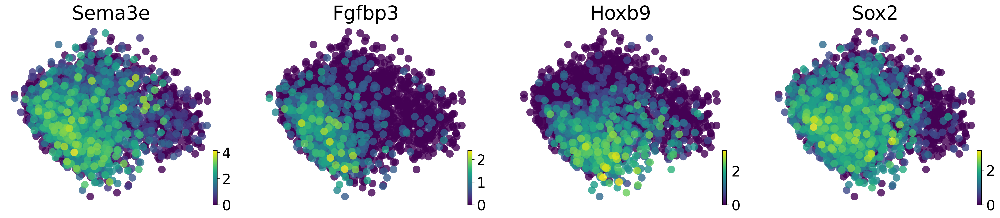

In [256]:
scv.pl.scatter(
    copy, 
    basis='latent_space_pca', 
    title=['Sema3e','Fgfbp3','Hoxb9','Sox2'],
    color=['Sema3e','Fgfbp3','Hoxb9','Sox2'], 
    show=False,
    alpha=0.8,
    size=500,
    legend_loc='right margin',
    fontsize=28, 
    legend_fontsize=22, components="1,2", dpi=300,
)

for fig in plt.get_fignums():
    fig = plt.figure(fig)
    # Set the figure facecolor to transparent
    fig.patch.set_facecolor('none')

    # Loop over the axes in the figure
    for ax in fig.get_axes():
        # Set the axes facecolor to white
        ax.set_facecolor('white')

plt.savefig('../figures/2.6.7_d3_neural.png', bbox_inches='tight')
plt.show()

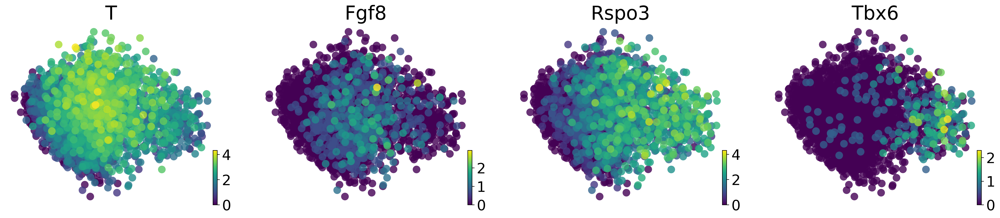

In [257]:
scv.pl.scatter(
    copy, 
    basis='latent_space_pca', 
    title=['T','Fgf8','Rspo3','Tbx6'],
    color=['T','Fgf8','Rspo3','Tbx6'], 
    show=False,
    alpha=0.8,
    size=500,
    legend_loc='right margin',
    fontsize=28, 
    legend_fontsize=22, components="1,2", dpi=300,
)

for fig in plt.get_fignums():
    fig = plt.figure(fig)
    # Set the figure facecolor to transparent
    fig.patch.set_facecolor('none')

    # Loop over the axes in the figure
    for ax in fig.get_axes():
        # Set the axes facecolor to white
        ax.set_facecolor('white')

plt.savefig('../figures/2.6.8_d3_meso.png', bbox_inches='tight')
plt.show()

In [136]:
fig, ax1 = plt.figure
scv.pl.scatter(copy, basis='vae', color='timepoint', alpha=0.1, palette=colpal.timepoint,
              ax=ax1, size=1000, show=False, components=f"{components[0]+1},{components[1]+1}",
               legend_loc=False, title="PC1 v. PC2", fontsize=32)

<Axes: title={'center': 'PC1 v. PC2'}>